<a href="https://colab.research.google.com/github/engmohamedsalah/AIMaster-MachineLearningDeepLearning/blob/main/Week_3_Explain_Image_Classifiers_Using_LIME.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### In this lab work, we will applying LIME to explain black-box image classifiers.

Install the following libraries your local environment, if not already installed.

In [2]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=f1d95623b66bac96e3e46a636e01fe18f5038ffadf3f5295b821b5903e53dab2
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [7]:
import warnings
warnings.filterwarnings("ignore")
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as c_map
from IPython.display import Image, display
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.xception import Xception, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image

import lime
from lime import lime_image
from lime import submodular_pick

from skimage.segmentation import mark_boundaries

import time  # Import the time module
import urllib.request # Import urllib.request

np.random.seed(123)

### Loading the data

Since we are more interested to check how black-box image classifiers can be explained using LIME, we will focus only on the inference part. Let us load any generic image data. For this example, we will take the data from this source: https://i.imgur.com/1Phh6hv.jpeg

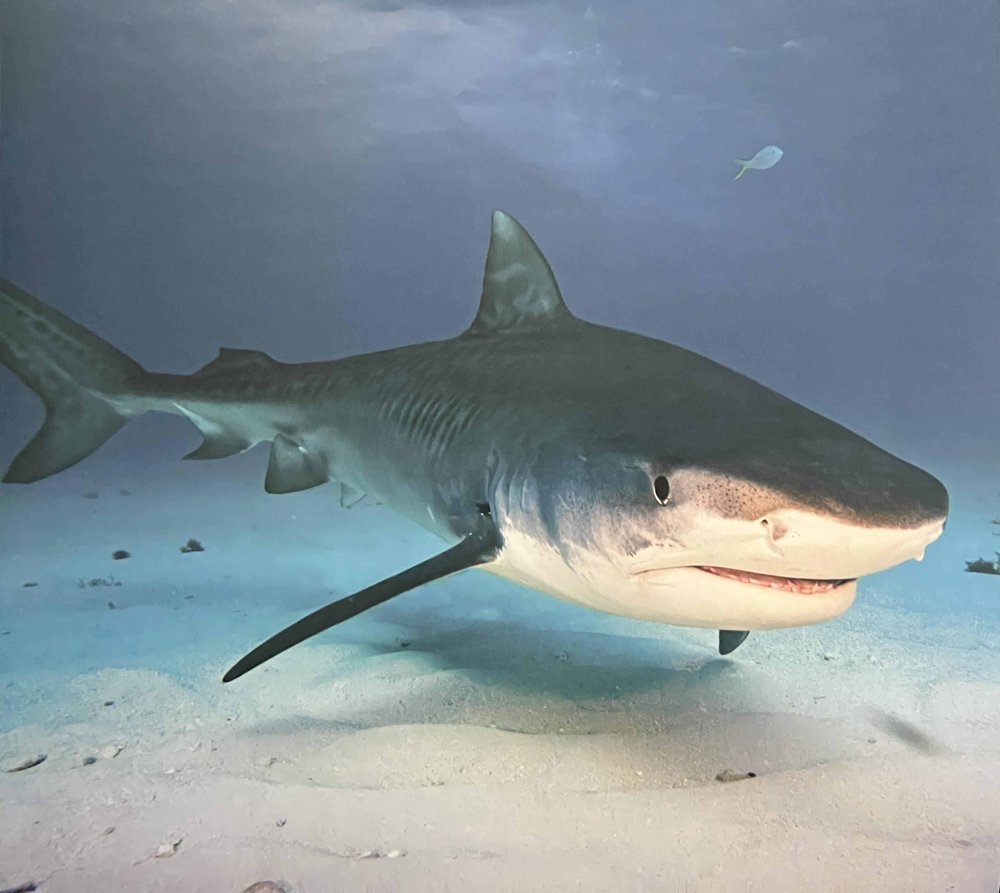

In [13]:
import requests
from PIL import Image as PILImage
from io import BytesIO

def load_image_data_from_url(url):
    '''
    Function to load image data from an online URL with User-Agent header
    '''
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'
    }

    response = requests.get(url, headers=headers)
    if response.status_code == 200:
        img = PILImage.open(BytesIO(response.content))
        display(img)
        return img
    else:
        print(f"Failed to load image, HTTP status code: {response.status_code}")
        return None

image_path = load_image_data_from_url(url="https://i.imgur.com/1Phh6hv.jpeg")


We will perform some initial data pre-processing with images.

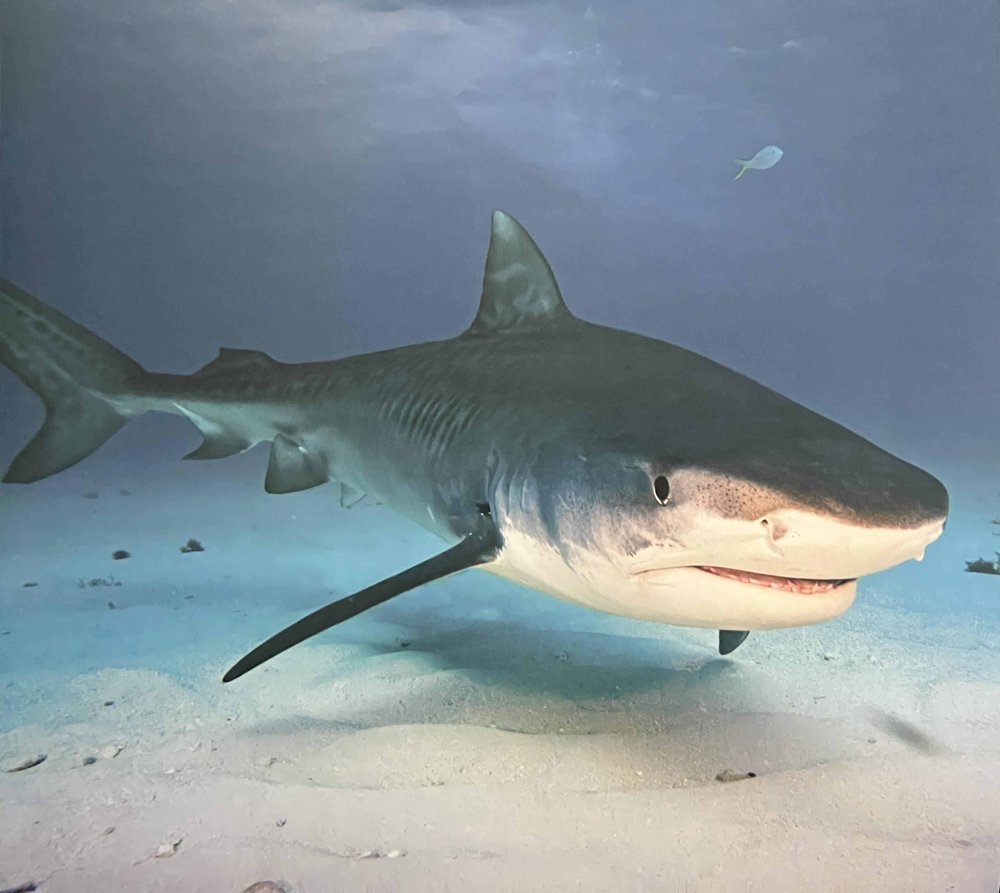

In [15]:
image_path

In [16]:
IMG_SIZE = (299, 299)
def transform_image(img, size): # Changed image_path to img
    '''
    Function to transform an image to normalized numpy array
    '''
    # The image is already loaded, so we don't need to load it again.
    # Instead, we directly resize the loaded image.
    img = img.resize(size) # Resize the loaded PIL Image
    img = image.img_to_array(img) # Transforming the image to get the shape as [channel, height, width]
    img = np.expand_dims(img, axis=0) # Adding dimension to convert array into a batch of size (1,299,299,3)
    img = img/255.0 # normalizing the image to keep within the range of 0.0 to 1.0

    return img

normalized_img = transform_image(image_path, IMG_SIZE) # Pass the loaded image

In [47]:
normalized_img

array([[[[0.3137255 , 0.3647059 , 0.38039216],
         [0.3254902 , 0.3764706 , 0.40392157],
         [0.3254902 , 0.3764706 , 0.40784314],
         ...,
         [0.43137255, 0.5019608 , 0.5882353 ],
         [0.42352942, 0.49803922, 0.5764706 ],
         [0.41568628, 0.49019608, 0.5529412 ]],

        [[0.30980393, 0.36078432, 0.38039216],
         [0.3137255 , 0.36862746, 0.39607844],
         [0.3254902 , 0.3764706 , 0.40784314],
         ...,
         [0.43137255, 0.5019608 , 0.5882353 ],
         [0.42745098, 0.49803922, 0.5764706 ],
         [0.4117647 , 0.4862745 , 0.5529412 ]],

        [[0.30980393, 0.3647059 , 0.38431373],
         [0.31764707, 0.36862746, 0.39607844],
         [0.32156864, 0.37254903, 0.40392157],
         ...,
         [0.42745098, 0.49803922, 0.58431375],
         [0.42352942, 0.49411765, 0.5803922 ],
         [0.41960785, 0.49019608, 0.56078434]],

        ...,

        [[0.6156863 , 0.60784316, 0.6117647 ],
         [0.61960787, 0.6117647 , 0.6156863 ]

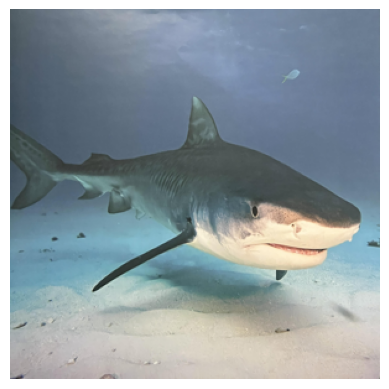

In [46]:
# prompt: plot the normalized_img

plt.imshow(np.squeeze(normalized_img))
plt.axis('off')
plt.show()


### Defining the model
For this example, we are not training a model from scratch, but rather defining a pretrained Tensorflow Xception model as our black-box Deep Learning model which we will be explaining using the LIME framework.

In [17]:
from tensorflow.keras.applications.xception import Xception
model = Xception(weights="imagenet")

91884032/91884032 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 396ms/step
The predicted class is : tiger_shark


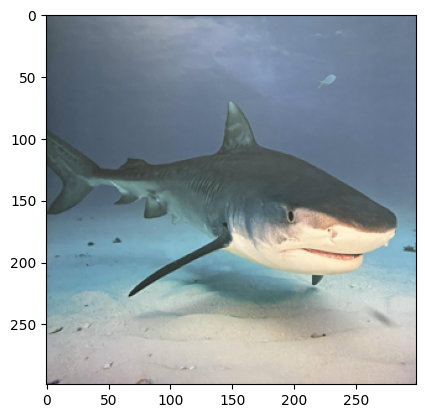

In [32]:
def get_model_predictions(data):
    model_prediction = model.predict(data)
    print(f"The predicted class is : {decode_predictions(model_prediction, top=1)[0][0][1]}")
    return decode_predictions(model_prediction, top=1)[0][0][1]

plt.imshow(normalized_img[0])
pred_orig = get_model_predictions(normalized_img)

The image is predicted as Tiger Shark which is the correct prediction and the black-box model is successfully able to give the correct prediction. Now, let us even take a look at the top 5 predictions along with the model confidences.

In [61]:
model_prediction = model.predict(normalized_img)
top5_pred = decode_predictions(model_prediction, top=5)[0]
for pred in top5_pred:
    print(pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
('n01491361', 'tiger_shark', 0.89935017)
('n01484850', 'great_white_shark', 0.011202738)
('n01494475', 'hammerhead', 0.004092638)
('n10565667', 'scuba_diver', 0.0011480226)
('n02640242', 'sturgeon', 0.0007971623)


As we see, although the model is well trained to produce the correct prediction, but there are chances that the model is not just looking into main object in the image but as well as the surrounding background. This is evident from the prediction of scuba_driver present in the top 5 prediction list. So, it is important for us understand, the key components or parts of the image the model is looking into to make the prediction.

### Model Explanation with LIME
Now, we will use the LIME framework to identify "super-pixels" or image segments used by the model to predict the outcome.

In [20]:
explainer = lime_image.LimeImageExplainer()

In [21]:
exp = explainer.explain_instance(normalized_img[0],
                                 model.predict,
                                 top_labels=5,
                                 hide_color=0,
                                 num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5

Our explainer object is ready, but let us visualize the various explanation segments created by the LIME algorithm.

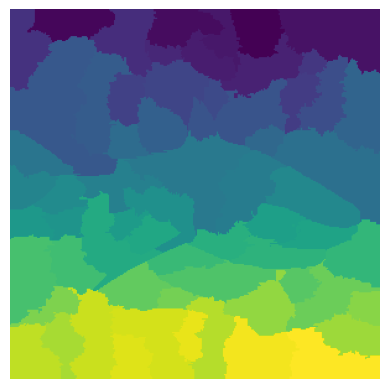

In [22]:
plt.imshow(exp.segments)
plt.axis('off')
plt.show()

Now, let us use the top segments or super pixels to identify the region of interest of the image used by the model to make its prediction.

In [87]:
def generate_prediction_sample(exp, exp_class, weight = 0.1, show_positive = True, hide_background = True):
    '''
    Method to display and highlight super-pixels used by the black-box model to make predictions
    '''
    image, mask = exp.get_image_and_mask(exp_class,
                                         positive_only=show_positive,
                                         num_features=6,
                                         hide_rest=hide_background,
                                         min_weight=weight
                                        )
    plt.imshow(mark_boundaries(image, mask))
    plt.axis('off')
    plt.show()


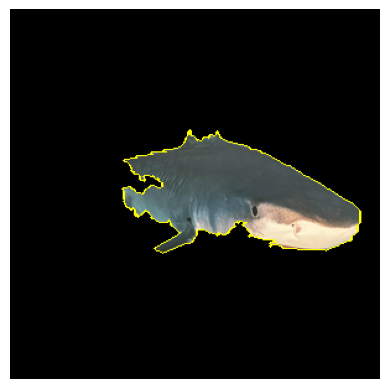

In [24]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive = True, hide_background = True)

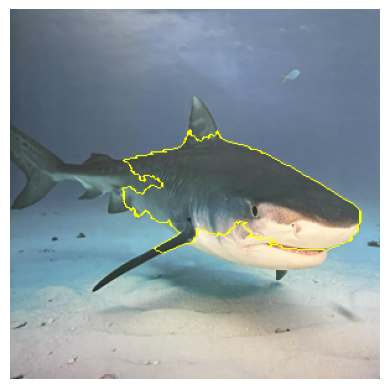

In [25]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive = True, hide_background = False)

As we can see from the above image that the model was able to identify the correct region, which does indicate the correct prediction of the outcome by the model.

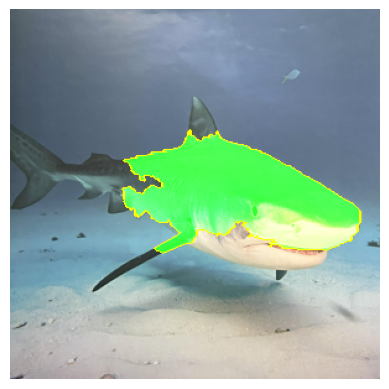

In [26]:
generate_prediction_sample(exp, exp.top_labels[0], show_positive = False, hide_background = False)

The above samples show us how we can hide or show the background along with the super-pixels or even outline or highlight the super-pixels to identify the region of interest used by the model to make the prediction. What we see from here does make sense, and does allow us to increase trust towards black-box models. We can also form a heat-map to show how important each super-pixel is to get some more granular explaianbility.

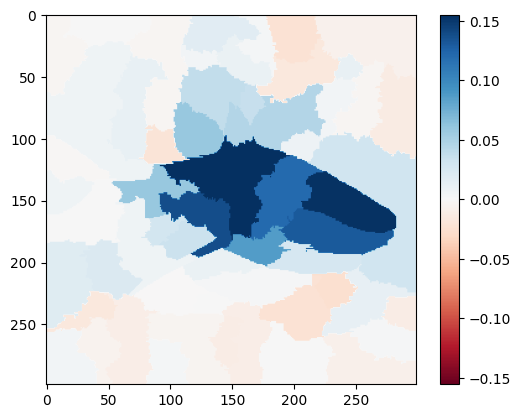

In [27]:
def explanation_heatmap(exp, exp_class):
    '''
    Using heat-map to highlight the importance of each super-pixel for the model prediction
    '''
    dict_heatmap = dict(exp.local_exp[exp_class])
    heatmap = np.vectorize(dict_heatmap.get)(exp.segments)
    plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
    plt.colorbar()
    plt.show()

explanation_heatmap(exp, exp.top_labels[0])

We can clearly identify the most influential segments used by the model to make the prediction using this heatmap visualization.

Now, let try to perform the same steps for another explanation class and see if the results are different.

In [28]:
index = 2
print(f"We will deal with predicted class: {top5_pred[index][1]}")

We will deal with predicted class: hammerhead


We will deal with predicted class: hammerhead

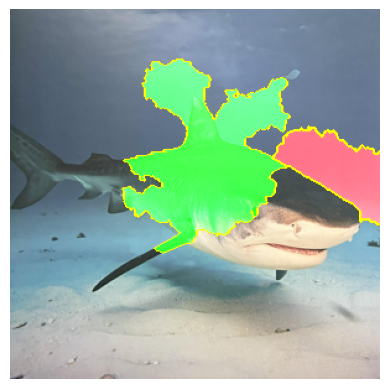

In [29]:
generate_prediction_sample(exp, exp.top_labels[index], weight = 0.0001, show_positive = False, hide_background = False)


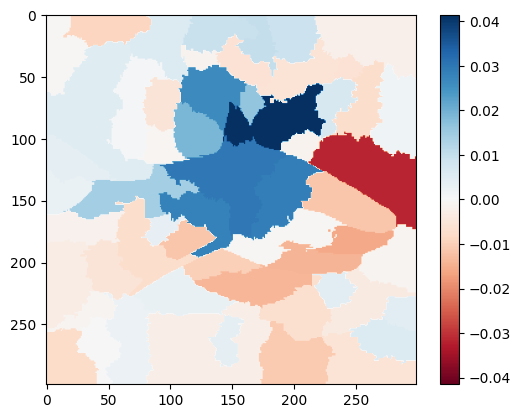

In [30]:
explanation_heatmap(exp, exp.top_labels[index])

In this case, we are trying to find out what made the model predict the outcome as hammerhead shark. When we used the LIME explaianbility methods, the visualizations clearly show that the middle part of the shark along with its fin, does contribute positively towards predicting the outcome as hammerhead shark, but the face and the front part contribute negatively towards the prediction. This is quite consistent with our human knowledge as well. Hammerhead Sharks are also sharks, so the middle part and the fin looks similar to Tiger Sharks but the face or the front portion of the hammerhead sharks looks like the shape of a hammer, which is significantly different from that of a tiger shark.

### Try with pretrained Tensorflow models (ResNet50, VGG16, VGG19, InceptionV3 and others), observe and analyse different outcomes.
#### Refer: https://keras.io/api/applications/ to see differnet pretrained Tensorflow model

In [81]:
### Try with pretrained Tensorflow models (ResNet50, VGG16, VGG19, InceptionV3 and others), observe and analyse different outcomes.
def get_model_prediction_ResNet50(data,model):
    # Resize the image to (224, 224)
    resized_data = tf.image.resize(data, [224, 224])

    # Now predict using the resized image
    model_prediction = model.predict(resized_data)
    print(f"The predicted class is : {decode_predictions(model_prediction, top=5)[0][0][1]}")
    return decode_predictions(model_prediction, top=1)[0][0][1]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
The predicted class is : nematode


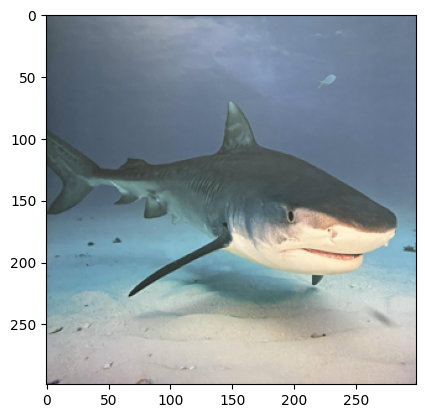

In [88]:

from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

# Load the pre-trained ResNet50 model
model_ResNet50 = ResNet50(weights='imagenet')

# Now, you can use this model for prediction and explanation using LIME as before.
# Example:
plt.imshow(normalized_img[0])

# create prediction
pred_orig = get_model_prediction_ResNet50(normalized_img,model_ResNet50)




  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 

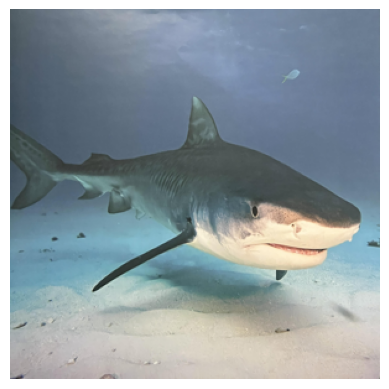

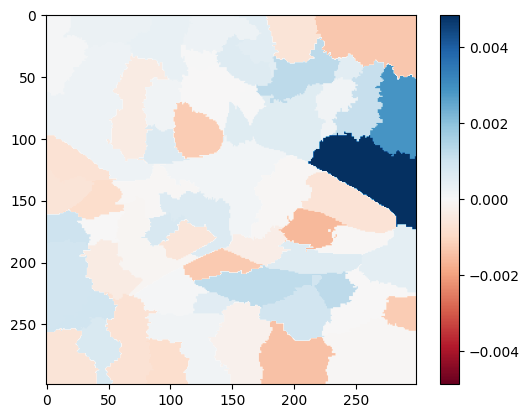

In [89]:

explainer = lime_image.LimeImageExplainer()
exp = explainer.explain_instance(normalized_img[0],
                                 model_ResNet50.predict,
                                 top_labels=5,
                                 hide_color=0,
                                 num_samples=500)

# Generate prediction sample (example using top label)
generate_prediction_sample(exp, exp.top_labels[0], show_positive=True, hide_background=False)

# Explanation heatmap
explanation_heatmap(exp, exp.top_labels[0])


553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 16s 0us/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step
The predicted class is : mosquito_net


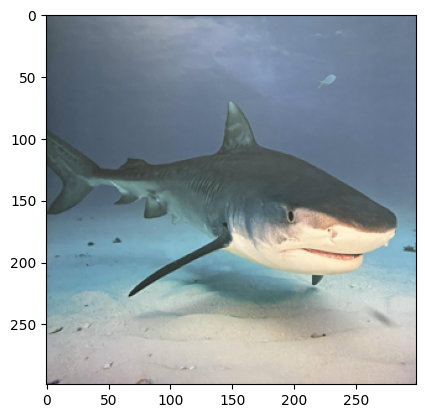

In [73]:

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions

# Load the pre-trained VGG16 model
model = VGG16(weights='imagenet')

def get_model_prediction_VGG16(data):
    # Resize the image to (224, 224)
    resized_data = tf.image.resize(data, [224, 224])

    # Now predict using the resized image
    model_prediction = model.predict(resized_data)
    print(f"The predicted class is : {decode_predictions(model_prediction, top=5)[0][0][1]}")
    return decode_predictions(model_prediction, top=1)[0][0][1]

# Now, you can use this model for prediction and explanation using LIME as before.
# Example:
plt.imshow(normalized_img[0])

# create prediction
pred_orig = get_model_prediction_VGG16(normalized_img)


# You can now continue with the LIME explanation steps as before, using the VGG16 model.


In [ ]:

explainer = lime_image.LimeImageExplainer()
exp = explainer.explain_instance(normalized_img[0],
                                 model.predict,
                                 top_labels=5,
                                 hide_color=0,
                                 num_samples=1000)

# Our explainer object is ready, but let us visualize the various explanation segments created by the LIME algorithm.
plt.imshow(exp.segments)
plt.axis('off')
plt.show()

generate_prediction_sample(exp, exp.top_labels[0], show_positive = True, hide_background = True)
generate_prediction_sample(exp, exp.top_labels[0], show_positive = True, hide_background = False)
# As we can see from the above image that the model was able to identify the correct region, which does indicate the correct prediction of the outcome by the model.
generate_prediction_sample(exp, exp.top_labels[0], show_positive = False, hide_background = False)
# The above samples show us how we can hide or show the background along with the super-pixels or even outline or highlight the super-pixels to identify the region of interest used by the model to make the prediction. What we see from here does make sense, and does allow us to increase trust towards black-box models. We can also form a heat-map to show how important each super-pixel is to get some more granular explaianbility.
def explanation_heatmap(exp, exp_class):
    '''
    Using heat-map to highlight the importance of each super-pixel for the model prediction
    '''
    dict_heatmap = dict(exp.local_exp[exp_class])
    heatmap = np.vectorize(dict_heatmap.get)(exp.segments)
    plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
    plt.colorbar()
    plt.show()

explanation_heatmap(exp, exp.top_labels[0])
# We can clearly identify the most influential segments used by the model to make the prediction using this heatmap visualization.
# Now, let try to perform the same steps for another explanation class and see if the results are different.
index = 2
print(f"We will deal with predicted class: {top5_pred[index][1]}")
# We will deal with predicted class: hammerhead
generate_prediction_sample(exp, exp.top_labels[index], weight = 0.0001, show_positive = False, hide_background = False)

explanation_heatmap(exp, exp.top_labels[index])


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
The predicted class is : tiger_shark


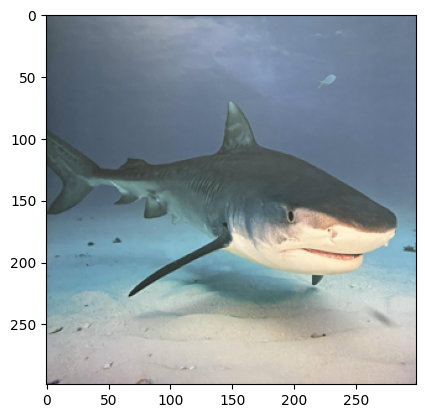

In [91]:
# prompt: try use model InceptionV3

from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions

# Load the pre-trained InceptionV3 model
model_inceptionV3 = InceptionV3(weights='imagenet')

def get_model_prediction_InceptionV3(data):
    # Resize the image to (299, 299)
    resized_data = tf.image.resize(data, [299, 299])

    # Now predict using the resized image
    model_prediction = model_inceptionV3.predict(resized_data)
    print(f"The predicted class is : {decode_predictions(model_prediction, top=5)[0][0][1]}")
    return decode_predictions(model_prediction, top=1)[0][0][1]

# Now, you can use this model for prediction and explanation using LIME as before.
# Example:
plt.imshow(normalized_img[0])

# create prediction
pred_orig = get_model_prediction_InceptionV3(normalized_img)

# You can now continue with the LIME explanation steps as before, using the InceptionV3 model.


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 

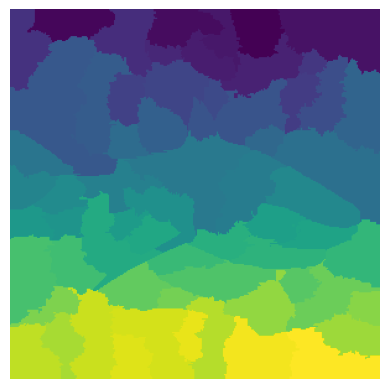

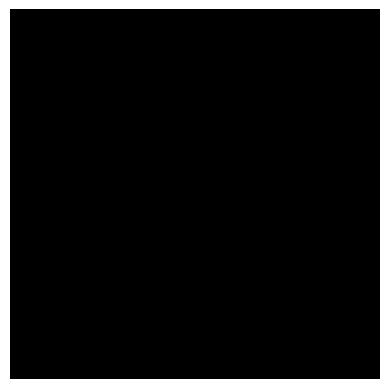

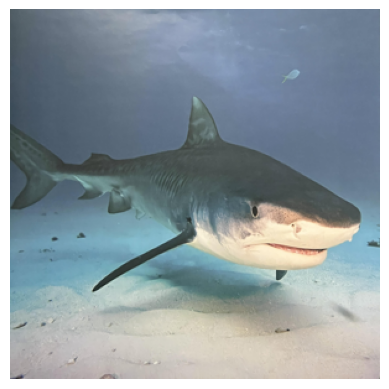

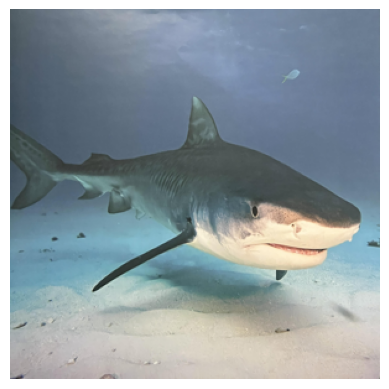

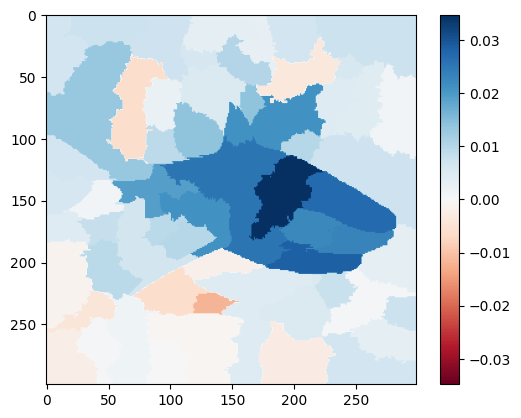

We will deal with predicted class: hammerhead


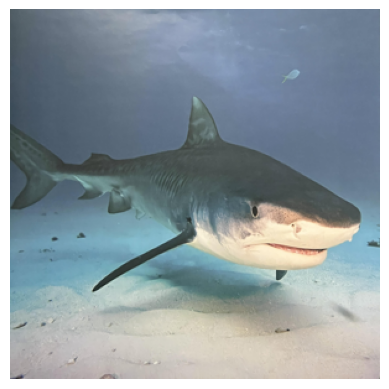

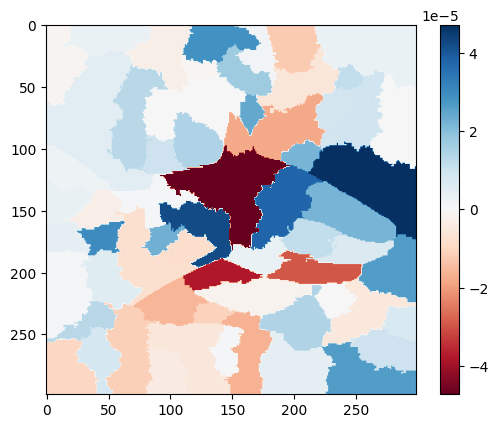

In [92]:
# prompt: use lim

explainer = lime_image.LimeImageExplainer()
exp = explainer.explain_instance(normalized_img[0],
                                 model_inceptionV3.predict,
                                 top_labels=5,
                                 hide_color=0,
                                 num_samples=1000)

# Our explainer object is ready, but let us visualize the various explanation segments created by the LIME algorithm.
plt.imshow(exp.segments)
plt.axis('off')
plt.show()

generate_prediction_sample(exp, exp.top_labels[0], show_positive = True, hide_background = True)
generate_prediction_sample(exp, exp.top_labels[0], show_positive = True, hide_background = False)
# As we can see from the above image that the model was able to identify the correct region, which does indicate the correct prediction of the outcome by the model.
generate_prediction_sample(exp, exp.top_labels[0], show_positive = False, hide_background = False)
# The above samples show us how we can hide or show the background along with the super-pixels or even outline or highlight the super-pixels to identify the region of interest used by the model to make the prediction. What we see from here does make sense, and does allow us to increase trust towards black-box models. We can also form a heat-map to show how important each super-pixel is to get some more granular explaianbility.
def explanation_heatmap(exp, exp_class):
    '''
    Using heat-map to highlight the importance of each super-pixel for the model prediction
    '''
    dict_heatmap = dict(exp.local_exp[exp_class])
    heatmap = np.vectorize(dict_heatmap.get)(exp.segments)
    plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
    plt.colorbar()
    plt.show()

explanation_heatmap(exp, exp.top_labels[0])
# We can clearly identify the most influential segments used by the model to make the prediction using this heatmap visualization.
# Now, let try to perform the same steps for another explanation class and see if the results are different.
index = 2
print(f"We will deal with predicted class: {top5_pred[index][1]}")
# We will deal with predicted class: hammerhead
generate_prediction_sample(exp, exp.top_labels[index], weight = 0.0001, show_positive = False, hide_background = False)

explanation_heatmap(exp, exp.top_labels[index])
